In [60]:
import pandas as pd
import math
import tensorflow as tf
from tensorflow import keras 
import matplotlib.pyplot as plt
import numpy as np
import PIL
import pathlib
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import os
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout 

# Import & View Data

In [189]:
for dirname, _, filenames in os.walk('C:/Users/Jadeyuan/Desktop\/cat_v1'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\00438-Bengal-cat-snarling.jpg
C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\00441-Very-timid-Brown-Spotted-Bengal-cat-ears-back.jpg
C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\00e79f939696ea0c095603154c4af840.jpg
C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\03915-Pair-of-Bengal-kittens-white-background.jpg
C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\04413-Bengal-cat-white-background.jpg
C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\047ffa2f7165ccc4585e418ddb800299.jpg
C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\05050-Brown-spotted-Bengal-cat-sitting-on-grey-background.jpg
C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\09a0c5d574f818471c84cf509fc786dc.jpg
C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\0c87060cea587a01f0a254066c95deaa.jpg
C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\106f59608bc9fc6ac11df31008efdf94.jpg
C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\1096165.jpg
C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\1111246.jpg
C:/Users/Jadeyuan/Desktop\/cat_v1\bengal\1113154.jpg
C:/Users/J

In [239]:
data_dir = "C:/Users/Jadeyuan/Desktop\/cat_v1"
data_dir = pathlib.Path(data_dir)

In [191]:
#number of classes
len(next(os.walk(data_dir))[1])

5

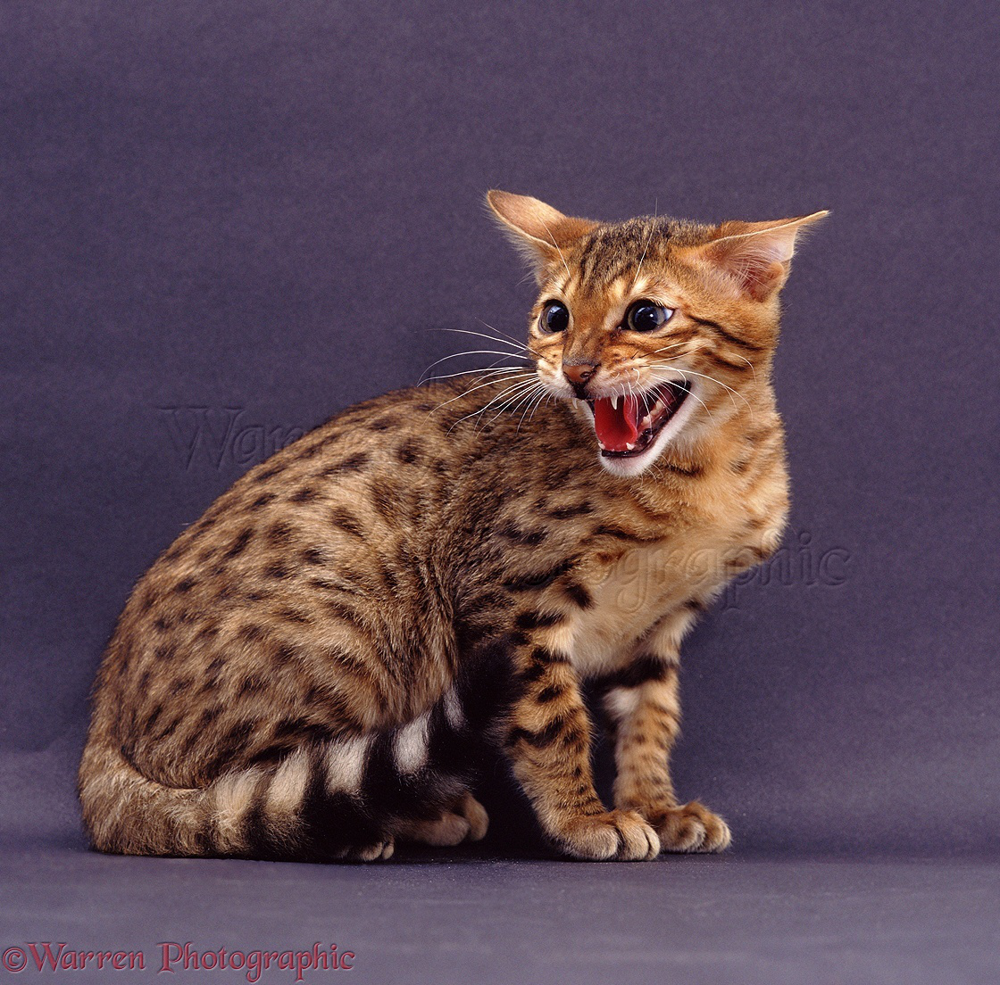

In [192]:
bengal = list(data_dir.glob('bengal/*'))
PIL.Image.open(str(bengal[0]))

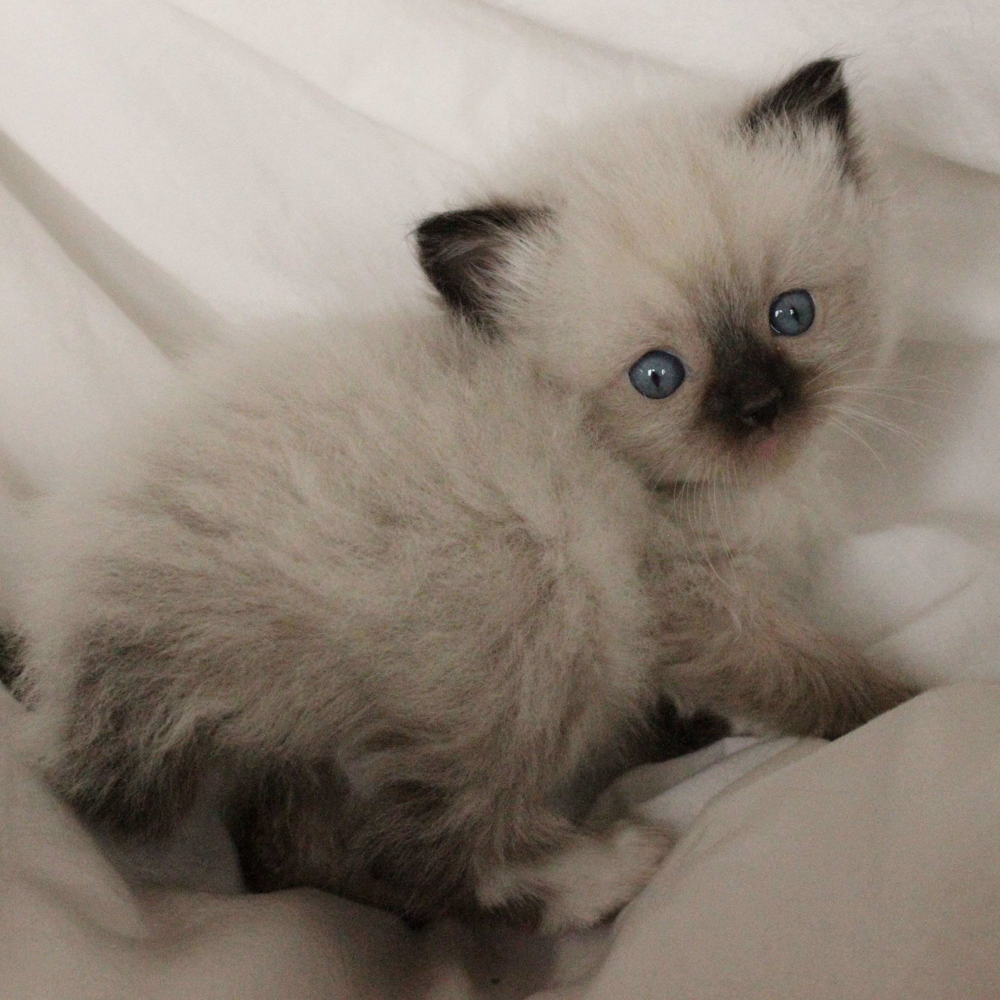

In [193]:
ragdoll = list(data_dir.glob('ragdoll/*'))
PIL.Image.open(str(ragdoll[0]))

In [194]:
domestic_shorthair = list(data_dir.glob('domestic_shorthair/*'))
maine_coon = list(data_dir.glob('maine_coon/*'))
siamese = list(data_dir.glob('siamese/*'))

In [195]:
# check each class's image numbers
num_bengal_pics = len(bengal)
num_ragdoll_pics = len(ragdoll)
num_shorthair_pics = len(domestic_shorthair)
num_maine_coon_pics = len(maine_coon)
num_siamese_pics = len(siamese)
print("Number of Bengal pictures:", num_bengal_pics)
print("Number of Ragdoll pictures:", num_ragdoll_pics)
print("Number of Domestic Shorthair pictures:", num_shorthair_pics)
print("Number of Maine Coon pictures:", num_maine_coon_pics)
print("Number of Siamese pictures:", num_siamese_pics)

Number of Bengal pictures: 177
Number of Ragdoll pictures: 207
Number of Domestic Shorthair pictures: 170
Number of Maine Coon pictures: 191
Number of Siamese pictures: 208


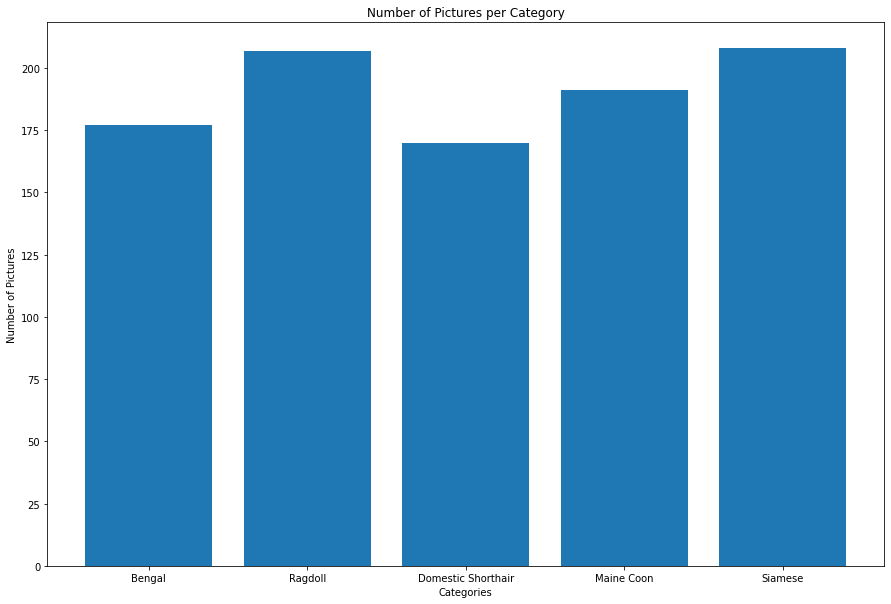

In [196]:
categories = ['Bengal', 'Ragdoll', 'Domestic Shorthair', 'Maine Coon', 'Siamese']
num_pics = [num_bengal_pics, num_ragdoll_pics, num_shorthair_pics, num_maine_coon_pics, num_siamese_pics]
plt.figure(figsize=(15, 10))
plt.bar(categories, num_pics)
plt.xlabel('Categories')
plt.ylabel('Number of Pictures')
plt.title('Number of Pictures per Category')
plt.show()

# Data Augmentation & Split Datasets

In [197]:
from keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

In [198]:
train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='sparse',
    subset='training'
)

Found 763 images belonging to 5 classes.


In [199]:
validation_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='sparse',
    subset='validation'
)

Found 188 images belonging to 5 classes.


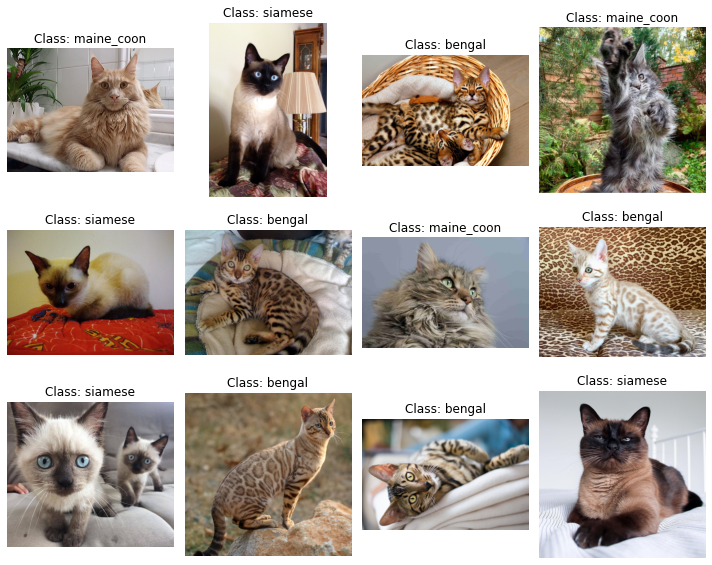

In [337]:
class_names = ['bengal', 'domestic_shorthair', 'maine_coon', 'ragdoll', 'siamese']

# Get the filenames and class labels from the train_generator
filenames = train_generator.filenames
class_labels = train_generator.classes

# Randomly select 12 indices
random_indices = random.sample(range(len(filenames)), 12)

# Create a subplot grid
fig, ax = plt.subplots(3, 4)
fig.set_size_inches(10, 8)

# Iterate over the random indices and display the corresponding images
for i, index in enumerate(random_indices):
    img = plt.imread(str(data_dir) + '/' + filenames[index])
    row = i // 4
    col = i % 4
    ax[row, col].imshow(img)
    ax[row, col].set_title('Class: ' + class_names[class_labels[index]])
    ax[row, col].axis('off')

plt.tight_layout()

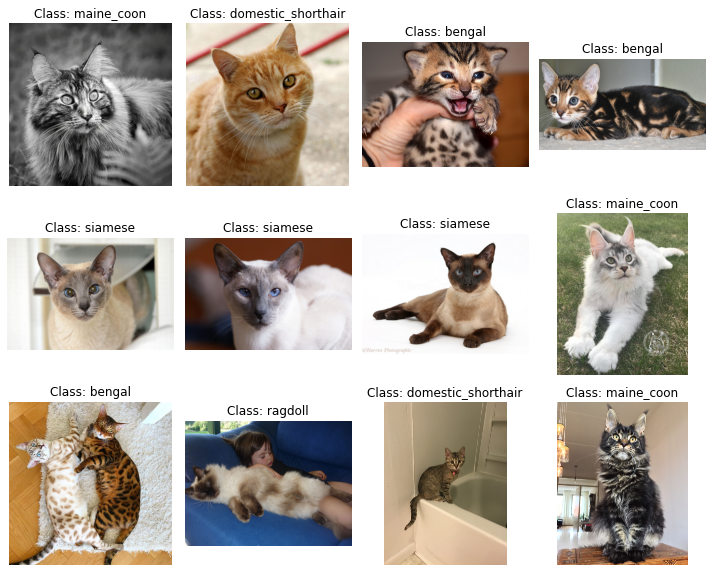

In [338]:
class_names = ['bengal', 'domestic_shorthair', 'maine_coon', 'ragdoll', 'siamese']

# Get the filenames and class labels from the train_generator
filenames = validation_generator.filenames
class_labels = validation_generator.classes

# Randomly select 12 indices
random_indices = random.sample(range(len(filenames)), 12)

# Create a subplot grid
fig, ax = plt.subplots(3, 4)
fig.set_size_inches(10, 8)

# Iterate over the random indices and display the corresponding images
for i, index in enumerate(random_indices):
    img = plt.imread(str(data_dir) + '/' + filenames[index])
    row = i // 4
    col = i % 4
    ax[row, col].imshow(img)
    ax[row, col].set_title('Class: ' + class_names[class_labels[index]])
    ax[row, col].axis('off')

plt.tight_layout()

In [200]:
train_generator.image_shape

(128, 128, 3)

In [201]:
train_generator.num_classes

5

In [202]:
validation_generator.image_shape

(128, 128, 3)

# Baseline Model

In [125]:
#initial classifier
classifier = Sequential()
classifier.add(Conv2D(filters=32, kernel_size=3, padding='same', input_shape=(128, 128, 3), activation='relu'))
classifier.add(MaxPooling2D())
classifier.add(Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'))
classifier.add(MaxPooling2D())
classifier.add(Flatten())
classifier.add(Dense(units=128, activation='relu'))
classifier.add(Dense(units=5, activation='softmax'))
classifier.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [126]:
classifier.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_16 (Conv2D)          (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 32, 32, 64)       0         
 g2D)                                                            
                                                                 
 flatten_8 (Flatten)         (None, 65536)             0         
                                                                 
 dense_24 (Dense)            (None, 128)             

In [76]:
history = classifier.fit(
  train_generator,
  validation_data=validation_generator,
  epochs=10)

Epoch 1/10
24/24 [==============================] - 243s 10s/step - loss: 2.1341 - accuracy: 0.2241 - val_loss: 1.6019 - val_accuracy: 0.2766
Epoch 2/10
24/24 [==============================] - 210s 9s/step - loss: 1.5802 - accuracy: 0.2792 - val_loss: 1.5393 - val_accuracy: 0.2926
Epoch 3/10
24/24 [==============================] - 198s 8s/step - loss: 1.4628 - accuracy: 0.3801 - val_loss: 1.4205 - val_accuracy: 0.3670
Epoch 4/10
24/24 [==============================] - 237s 10s/step - loss: 1.3543 - accuracy: 0.4312 - val_loss: 1.3996 - val_accuracy: 0.4202
Epoch 5/10
24/24 [==============================] - 160s 7s/step - loss: 1.3013 - accuracy: 0.4718 - val_loss: 1.3465 - val_accuracy: 0.4202
Epoch 6/10
24/24 [==============================] - 159s 7s/step - loss: 1.2628 - accuracy: 0.4902 - val_loss: 1.4017 - val_accuracy: 0.3989
Epoch 7/10
24/24 [==============================] - 142s 6s/step - loss: 1.2321 - accuracy: 0.5125 - val_loss: 1.3630 - val_accuracy: 0.4468
Epoch 8/10


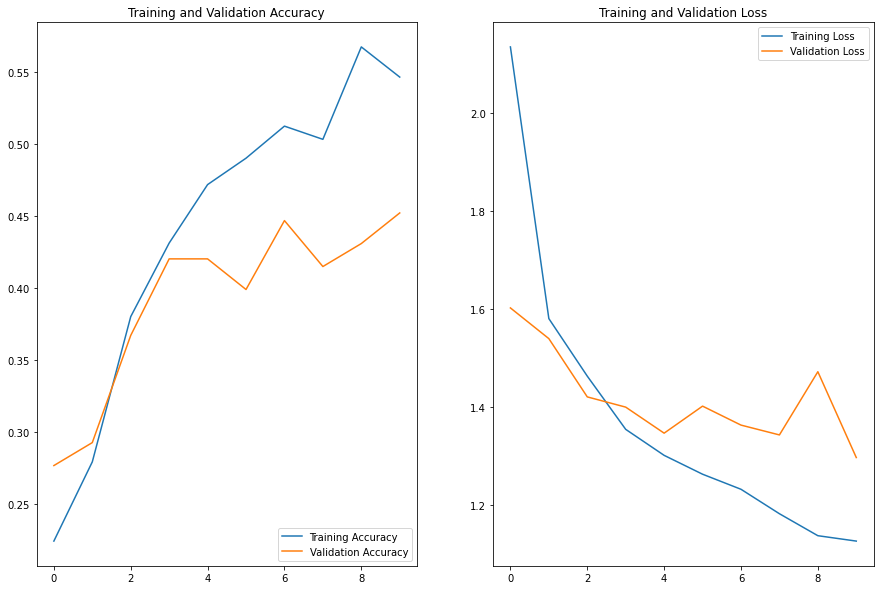

In [82]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(10)

plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# Developed Model(more complicated)

In [145]:
classifier2 = Sequential()
classifier2.add(Conv2D(filters=32, kernel_size=3, padding='same', input_shape=(128, 128, 3), activation='relu'))
classifier2.add(MaxPooling2D())
classifier2.add(Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'))
classifier2.add(MaxPooling2D())
classifier2.add(Conv2D(filters=128, kernel_size=3, padding='same', activation='relu'))
classifier2.add(MaxPooling2D())
classifier2.add(Flatten())
classifier2.add(Dense(units=128, activation='relu'))
classifier2.add(Dropout(0.2))
classifier2.add(Dense(units=5, activation='softmax'))
classifier2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [146]:
classifier2.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_17 (Conv2D)          (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 32, 32, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 32, 32, 128)       73856     
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 16, 16, 128)    

In [80]:
history2 = classifier2.fit(
  train_generator,
  validation_data=validation_generator,
  epochs=12)

Epoch 1/12
24/24 [==============================] - 159s 6s/step - loss: 1.6275 - accuracy: 0.2215 - val_loss: 1.5740 - val_accuracy: 0.2074
Epoch 2/12
24/24 [==============================] - 160s 6s/step - loss: 1.5271 - accuracy: 0.3250 - val_loss: 1.4391 - val_accuracy: 0.3723
Epoch 3/12
24/24 [==============================] - 151s 6s/step - loss: 1.4349 - accuracy: 0.3748 - val_loss: 1.3343 - val_accuracy: 0.4043
Epoch 4/12
24/24 [==============================] - 152s 6s/step - loss: 1.2994 - accuracy: 0.4482 - val_loss: 1.3086 - val_accuracy: 0.4096
Epoch 5/12
24/24 [==============================] - 148s 6s/step - loss: 1.2638 - accuracy: 0.4600 - val_loss: 1.2965 - val_accuracy: 0.4362
Epoch 6/12
24/24 [==============================] - 149s 6s/step - loss: 1.2288 - accuracy: 0.4967 - val_loss: 1.3199 - val_accuracy: 0.4309
Epoch 7/12
24/24 [==============================] - 148s 6s/step - loss: 1.2171 - accuracy: 0.5007 - val_loss: 1.3028 - val_accuracy: 0.4309
Epoch 8/12
24

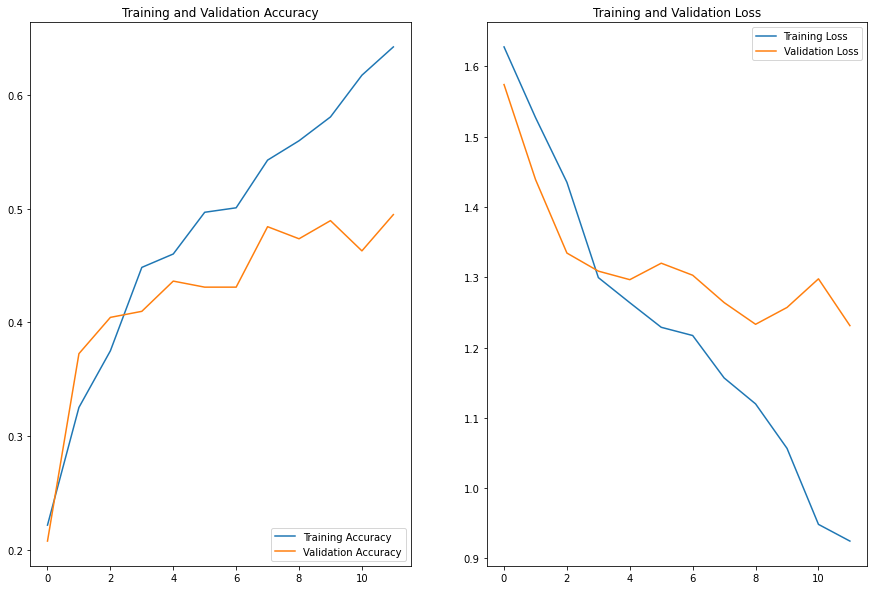

In [86]:
acc = history2.history['accuracy']
val_acc = history2.history['val_accuracy']

loss = history2.history['loss']
val_loss = history2.history['val_loss']

epochs_range = range(12)

plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [185]:
classifier3 = Sequential()
classifier3.add(Conv2D(filters=32, kernel_size=3, padding='same', input_shape=(128, 128, 3), activation='relu'))
classifier3.add(MaxPooling2D())
classifier3.add(Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'))
classifier3.add(MaxPooling2D())
classifier3.add(Conv2D(filters=128, kernel_size=3, padding='same', activation='relu'))
classifier3.add(MaxPooling2D())
classifier3.add(Conv2D(filters=256, kernel_size=3, padding='same', activation='relu'))
classifier3.add(MaxPooling2D())
classifier3.add(Flatten())
classifier3.add(Dense(units=512, activation='relu'))
classifier3.add(Dropout(0.5))
classifier3.add(Dense(units=128, activation='relu'))
classifier3.add(Dense(units=5, activation='softmax'))

In [186]:
classifier3.summary()

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 64, 64, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 32, 32, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_22 (Conv2D)          (None, 32, 32, 128)       73856     
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 16, 16, 128)    

In [187]:
classifier3.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [203]:
history3 = classifier3.fit(
  train_generator,
  validation_data=validation_generator,
  epochs=15)

Epoch 1/15
24/24 [==============================] - 225s 9s/step - loss: 1.6287 - accuracy: 0.2018 - val_loss: 1.5980 - val_accuracy: 0.1862
Epoch 2/15
24/24 [==============================] - 159s 7s/step - loss: 1.5827 - accuracy: 0.2700 - val_loss: 1.5407 - val_accuracy: 0.3032
Epoch 3/15
24/24 [==============================] - 142s 6s/step - loss: 1.4862 - accuracy: 0.3447 - val_loss: 1.3413 - val_accuracy: 0.3883
Epoch 4/15
24/24 [==============================] - 140s 6s/step - loss: 1.4105 - accuracy: 0.3906 - val_loss: 1.3706 - val_accuracy: 0.3830
Epoch 5/15
24/24 [==============================] - 137s 6s/step - loss: 1.3437 - accuracy: 0.4050 - val_loss: 1.3009 - val_accuracy: 0.4787
Epoch 6/15
24/24 [==============================] - 134s 6s/step - loss: 1.3043 - accuracy: 0.4338 - val_loss: 1.3268 - val_accuracy: 0.4149
Epoch 7/15
24/24 [==============================] - 138s 6s/step - loss: 1.2909 - accuracy: 0.4600 - val_loss: 1.2758 - val_accuracy: 0.4628
Epoch 8/15
24

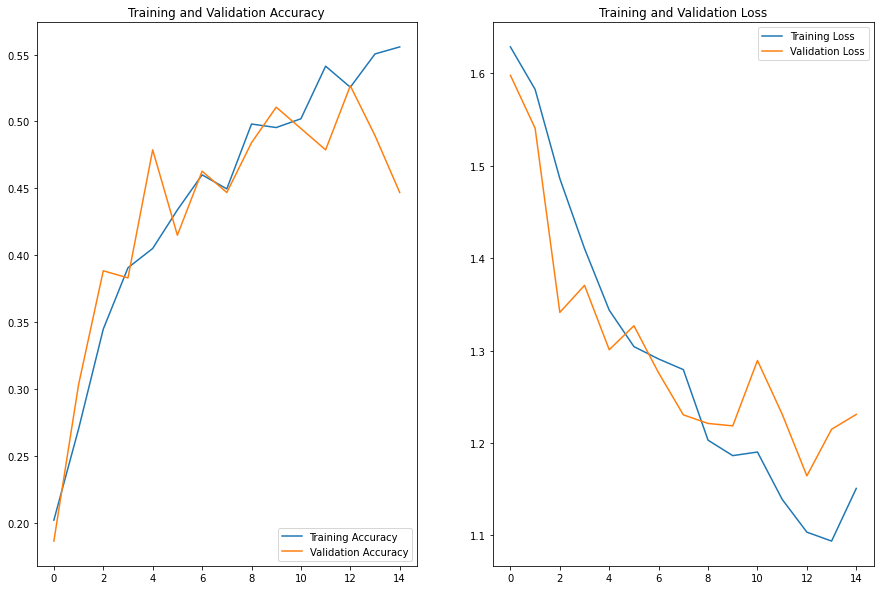

In [204]:
acc = history3.history['accuracy']
val_acc = history3.history['val_accuracy']

loss = history3.history['loss']
val_loss = history3.history['val_loss']

epochs_range = range(15)

plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# Apply transfer learning utilizing VGG16

In [205]:
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.applications import VGG16

base_classifier = VGG16(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

base_classifier.trainable = False

# Create a new model by adding your own classification layers on top of the pre-trained base model
classifier4 = Sequential()
classifier4.add(base_classifier)
classifier4.add(GlobalAveragePooling2D())
classifier4.add(Dense(units=512, activation='relu'))
classifier4.add(Dropout(0.5))
classifier4.add(Dense(units=128, activation='relu'))
classifier4.add(Dense(units=5, activation='softmax'))

# Compile the model
classifier4.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [206]:
classifier4.summary()

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 global_average_pooling2d_6   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_35 (Dense)            (None, 512)               262656    
                                                                 
 dropout_13 (Dropout)        (None, 512)               0         
                                                                 
 dense_36 (Dense)            (None, 128)               65664     
                                                                 
 dense_37 (Dense)            (None, 5)                 645       
                                                     

In [207]:
# Train the model
history4 = classifier4.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=13
)


Epoch 1/13
24/24 [==============================] - 208s 9s/step - loss: 1.5462 - accuracy: 0.3080 - val_loss: 1.4382 - val_accuracy: 0.4043
Epoch 2/13
24/24 [==============================] - 210s 9s/step - loss: 1.2697 - accuracy: 0.4718 - val_loss: 1.1811 - val_accuracy: 0.5638
Epoch 3/13
24/24 [==============================] - 205s 9s/step - loss: 1.1316 - accuracy: 0.5596 - val_loss: 1.0764 - val_accuracy: 0.5851
Epoch 4/13
24/24 [==============================] - 214s 9s/step - loss: 1.0791 - accuracy: 0.5793 - val_loss: 1.0465 - val_accuracy: 0.5798
Epoch 5/13
24/24 [==============================] - 202s 8s/step - loss: 1.0576 - accuracy: 0.5583 - val_loss: 1.0434 - val_accuracy: 0.5851
Epoch 6/13
24/24 [==============================] - 202s 8s/step - loss: 0.9578 - accuracy: 0.6134 - val_loss: 1.0286 - val_accuracy: 0.6170
Epoch 7/13
24/24 [==============================] - 202s 8s/step - loss: 0.9444 - accuracy: 0.6317 - val_loss: 1.0428 - val_accuracy: 0.5745
Epoch 8/13
24

UnknownError: Graph execution error:

OSError: broken data stream when reading image file
Traceback (most recent call last):

  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\tensorflow\python\ops\script_ops.py", line 267, in __call__
    ret = func(*args)

  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\tensorflow\python\autograph\impl\api.py", line 642, in wrapper
    return func(*args, **kwargs)

  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\tensorflow\python\data\ops\from_generator_op.py", line 198, in generator_py_func
    values = next(generator_state.get_iterator(iterator_id))

  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\keras\engine\data_adapter.py", line 902, in wrapped_generator
    for data in generator_fn():

  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\keras\engine\data_adapter.py", line 1049, in generator_fn
    yield x[i]

  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\keras\preprocessing\image.py", line 116, in __getitem__
    return self._get_batches_of_transformed_samples(index_array)

  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\keras\preprocessing\image.py", line 370, in _get_batches_of_transformed_samples
    img = image_utils.load_img(

  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\keras\utils\image_utils.py", line 479, in load_img
    img = img.resize(width_height_tuple, resample)

  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\PIL\Image.py", line 1961, in resize
    self.load()

  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\PIL\ImageFile.py", line 272, in load
    raise_oserror(err_code)

  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\PIL\ImageFile.py", line 67, in raise_oserror
    raise OSError(message + " when reading image file")

OSError: broken data stream when reading image file


	 [[{{node PyFunc}}]]
	 [[IteratorGetNext]] [Op:__inference_test_function_33589]

In [208]:
history4 = classifier4.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=13
)

Epoch 1/13
24/24 [==============================] - 237s 10s/step - loss: 0.7927 - accuracy: 0.6972 - val_loss: 0.9183 - val_accuracy: 0.6968
Epoch 2/13
24/24 [==============================] - 211s 9s/step - loss: 0.7961 - accuracy: 0.6894 - val_loss: 0.9849 - val_accuracy: 0.6330
Epoch 3/13
24/24 [==============================] - 187s 8s/step - loss: 0.7872 - accuracy: 0.6907 - val_loss: 0.9184 - val_accuracy: 0.6755
Epoch 4/13
24/24 [==============================] - 182s 8s/step - loss: 0.7232 - accuracy: 0.7169 - val_loss: 0.9098 - val_accuracy: 0.6596
Epoch 5/13
24/24 [==============================] - 183s 8s/step - loss: 0.7380 - accuracy: 0.7064 - val_loss: 0.9091 - val_accuracy: 0.6436
Epoch 6/13
24/24 [==============================] - 180s 7s/step - loss: 0.7349 - accuracy: 0.7313 - val_loss: 0.9585 - val_accuracy: 0.6755
Epoch 7/13
24/24 [==============================] - 179s 8s/step - loss: 0.7010 - accuracy: 0.7261 - val_loss: 0.9684 - val_accuracy: 0.6649
Epoch 8/13
2

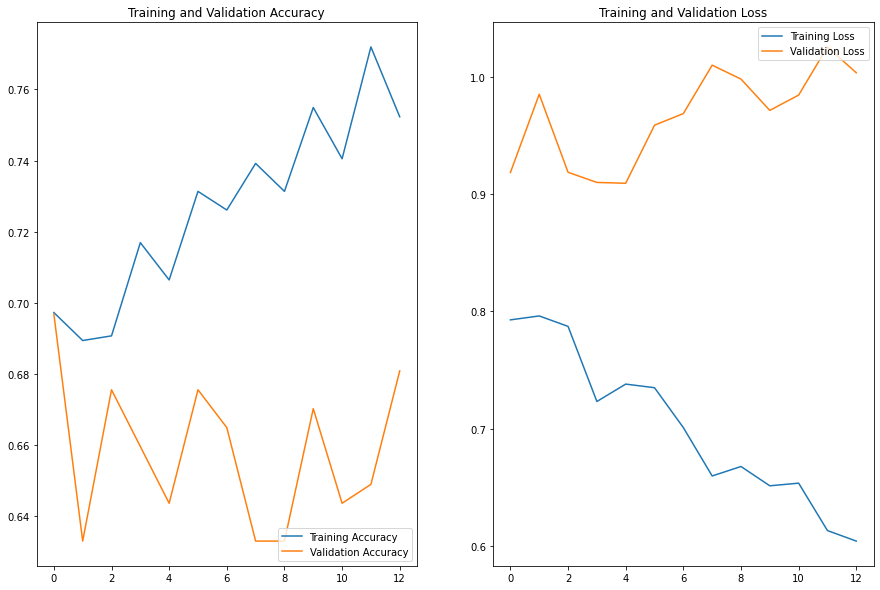

In [209]:
acc = history4.history['accuracy']
val_acc = history4.history['val_accuracy']

loss = history4.history['loss']
val_loss = history4.history['val_loss']

epochs_range = range(13)

plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [216]:
history4 = classifier4.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=13
)

Epoch 1/13
24/24 [==============================] - 226s 9s/step - loss: 0.6410 - accuracy: 0.7588 - val_loss: 1.0632 - val_accuracy: 0.6223
Epoch 2/13
24/24 [==============================] - 219s 9s/step - loss: 0.5827 - accuracy: 0.7772 - val_loss: 1.0244 - val_accuracy: 0.6436
Epoch 3/13
24/24 [==============================] - 197s 8s/step - loss: 0.5646 - accuracy: 0.7798 - val_loss: 0.9952 - val_accuracy: 0.6596
Epoch 4/13
24/24 [==============================] - 189s 8s/step - loss: 0.5890 - accuracy: 0.7706 - val_loss: 0.9872 - val_accuracy: 0.6277
Epoch 5/13
24/24 [==============================] - 195s 8s/step - loss: 0.5790 - accuracy: 0.7837 - val_loss: 1.0091 - val_accuracy: 0.6436
Epoch 6/13
24/24 [==============================] - 197s 8s/step - loss: 0.5266 - accuracy: 0.7955 - val_loss: 0.9864 - val_accuracy: 0.6596
Epoch 7/13
24/24 [==============================] - 181s 7s/step - loss: 0.5069 - accuracy: 0.8113 - val_loss: 1.0282 - val_accuracy: 0.6649
Epoch 8/13
24

In [211]:
from keras.optimizers import Adam

# Load the pre-trained VGG16 model with weights from ImageNet
base_classifier = VGG16(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Set the base model to be non-trainable
base_classifier.trainable = False

# Create a new model by adding your own classification layers on top of the pre-trained base model
classifier5 = Sequential()
classifier5.add(base_classifier)
classifier5.add(GlobalAveragePooling2D())
classifier5.add(Dense(units=512, activation='relu'))
classifier5.add(Dropout(0.5))
classifier5.add(Dense(units=128, activation='relu'))
classifier5.add(Dense(units=5, activation='softmax'))

optimizer = Adam(learning_rate=0.001)  # Adjust the learning rate as needed
classifier5.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [212]:
classifier5.summary()

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 global_average_pooling2d_8   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_41 (Dense)            (None, 512)               262656    
                                                                 
 dropout_15 (Dropout)        (None, 512)               0         
                                                                 
 dense_42 (Dense)            (None, 128)               65664     
                                                                 
 dense_43 (Dense)            (None, 5)                 645       
                                                     

In [213]:
# Train the model with data augmentation and increased number of epochs
history5 = classifier5.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=20  # Increase the number of epochs
)

Epoch 1/20
24/24 [==============================] - 290s 12s/step - loss: 1.5949 - accuracy: 0.3054 - val_loss: 1.3825 - val_accuracy: 0.4840
Epoch 2/20
24/24 [==============================] - 284s 12s/step - loss: 1.2966 - accuracy: 0.4692 - val_loss: 1.2044 - val_accuracy: 0.5479
Epoch 3/20
24/24 [==============================] - 245s 10s/step - loss: 1.1488 - accuracy: 0.5400 - val_loss: 1.1279 - val_accuracy: 0.5745
Epoch 4/20
24/24 [==============================] - 213s 9s/step - loss: 1.0290 - accuracy: 0.5819 - val_loss: 1.1032 - val_accuracy: 0.5745
Epoch 5/20
24/24 [==============================] - 192s 8s/step - loss: 1.0331 - accuracy: 0.5937 - val_loss: 1.0235 - val_accuracy: 0.6170
Epoch 6/20
24/24 [==============================] - 188s 8s/step - loss: 0.9695 - accuracy: 0.6212 - val_loss: 1.0107 - val_accuracy: 0.6223
Epoch 7/20
24/24 [==============================] - 188s 8s/step - loss: 0.9200 - accuracy: 0.6343 - val_loss: 1.0005 - val_accuracy: 0.6170
Epoch 8/20

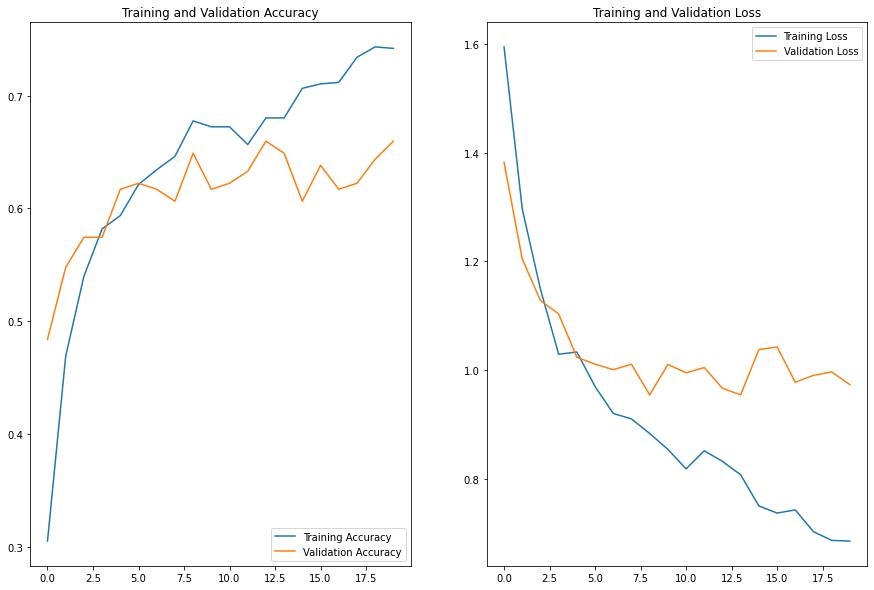

In [215]:
acc = history5.history['accuracy']
val_acc = history5.history['val_accuracy']

loss = history5.history['loss']
val_loss = history5.history['val_loss']

epochs_range = range(20)

plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [217]:
history5 = classifier5.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=5  #give 5 more epochs
)

Epoch 1/5
24/24 [==============================] - 227s 9s/step - loss: 0.6651 - accuracy: 0.7523 - val_loss: 1.0708 - val_accuracy: 0.6223
Epoch 2/5
24/24 [==============================] - 207s 9s/step - loss: 0.6780 - accuracy: 0.7235 - val_loss: 1.0145 - val_accuracy: 0.6223
Epoch 3/5
24/24 [==============================] - 195s 8s/step - loss: 0.6560 - accuracy: 0.7339 - val_loss: 0.9507 - val_accuracy: 0.6649
Epoch 4/5
24/24 [==============================] - 186s 8s/step - loss: 0.6373 - accuracy: 0.7549 - val_loss: 0.9778 - val_accuracy: 0.6649
Epoch 5/5
24/24 [==============================] - 186s 8s/step - loss: 0.6098 - accuracy: 0.7680 - val_loss: 1.0805 - val_accuracy: 0.6011


# Add Hyperparameter Tuning by utilizing Grid Search & More Data Augmentation

In [253]:
!pip install opencv-python

     --------------------------------------- 38.2/38.2 MB 15.2 MB/s eta 0:00:00


In [256]:
import cv2
labels = ['bengal', 'ragdoll','domestic_shorthair','maine_coon','siamese']
img_size = 128
def get_data(data_dir):
    data = [] 
    for label in labels: 
        path = os.path.join(data_dir, label)
        class_num = labels.index(label)
        for img in os.listdir(path):
            try:
                img_arr = cv2.imread(os.path.join(path, img), cv2.IMREAD_COLOR)
                resized_arr = cv2.resize(img_arr, (img_size, img_size)) 
                data.append([resized_arr, class_num])
            except Exception as e:
                print(e)
    return np.array(data)

In [257]:
data = get_data("C:/Users/Jadeyuan/Desktop\/cat_v1")

C:\Users\Jadeyuan\AppData\Local\Temp\ipykernel_3536\1620172695.py:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(data)


In [259]:
x = []
y = []

for feature, label in data:
    x.append(feature)
    y.append(label)
    
x = np.array(x, dtype=np.float32) / 255.0
x = x.reshape(-1, 128, 128, 3)
y = np.array(y)

In [260]:
from sklearn.preprocessing import LabelBinarizer
label_binarizer = LabelBinarizer()
y = label_binarizer.fit_transform(y)

In [273]:
x_train, x_test, y_train, y_test = train_test_split(x , y , test_size = 0.2 , stratify = y , random_state = 42)

In [324]:
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)
datagen.fit(x_train)

In [275]:
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.utils import shuffle
from keras.optimizers import Adam, RMSprop
from keras.wrappers.scikit_learn import KerasClassifier

def build_model(dropout_rate=0.2, learning_rate=0.001):
    # Load the pre-trained VGG16 model with weights from ImageNet
    base_classifier = VGG16(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
    base_classifier.trainable = False

    # Create a new model by adding your own classification layers on top of the pre-trained base model
    classifier6 = Sequential()
    classifier6.add(base_classifier)
    classifier6.add(GlobalAveragePooling2D())
    classifier6.add(Dense(units=512, activation='relu'))
    classifier6.add(Dropout(dropout_rate))
    classifier6.add(Dense(units=128, activation='relu'))
    classifier6.add(Dense(units=5, activation='softmax'))

    # Compile the model with the specified optimizer and learning rate
    optimizer = Adam(learning_rate=learning_rate)
    classifier6.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return classifier6

# Create the KerasModelWrapper
model = KerasClassifier(build_fn=build_model, verbose=1)

# Define the hyperparameter grid
param_grid = {
    'epochs': [10, 20, 25],
    'batch_size': [32, 64]
}


random_search = RandomizedSearchCV(model, param_grid, cv=3, random_state=42, scoring='accuracy')
random_search.fit(x_train, y_train)


C:\Users\Jadeyuan\AppData\Local\Temp\ipykernel_3536\2369437387.py:28: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = KerasClassifier(build_fn=build_model, verbose=1)
C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 6 is smaller than n_iter=10. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Epoch 1/10
16/16 [==============================] - 61s 4s/step - loss: 1.4969 - accuracy: 0.3445
Epoch 2/10
16/16 [==============================] - 67s 4s/step - loss: 1.1659 - accuracy: 0.5276
Epoch 3/10
16/16 [==============================] - 73s 5s/step - loss: 1.0059 - accuracy: 0.6043
Epoch 4/10
16/16 [==============================] - 56s 3s/step - loss: 0.9220 - accuracy: 0.6496
Epoch 5/10
16/16 [==============================] - 56s 4s/step - loss: 0.8442 - accuracy: 0.6732
Epoch 6/10
16/16 [==============================] - 58s 4s/step - loss: 0.7269 - accuracy: 0.7323
Epoch 7/10
16/16 [==============================] - 59s 4s/step - loss: 0.6592 - accuracy: 0.7480
Epoch 8/10
16/16 [==============================] - 80s 5s/step - loss: 0.6141 - accuracy: 0.7874
Epoch 9/10
16/16 [==============================] - 96s 6s/step - loss: 0.5625 - accuracy: 0.7795
Epoch 10/10
8/8 [==============================] - 42s 5s/step


C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/10
16/16 [==============================] - 101s 6s/step - loss: 1.5963 - accuracy: 0.3051
Epoch 2/10
16/16 [==============================] - 72s 4s/step - loss: 1.3227 - accuracy: 0.4902
Epoch 3/10
16/16 [==============================] - 59s 4s/step - loss: 1.0605 - accuracy: 0.6161
Epoch 4/10
16/16 [==============================] - 65s 4s/step - loss: 0.9339 - accuracy: 0.6437
Epoch 5/10
16/16 [==============================] - 76s 5s/step - loss: 0.8592 - accuracy: 0.6673
Epoch 6/10
16/16 [==============================] - 83s 5s/step - loss: 0.7950 - accuracy: 0.7047
Epoch 7/10
16/16 [==============================] - 58s 4s/step - loss: 0.7149 - accuracy: 0.7283
Epoch 8/10
16/16 [==============================] - 56s 3s/step - loss: 0.6588 - accuracy: 0.7539
Epoch 9/10
16/16 [==============================] - 56s 4s/step - loss: 0.5656 - accuracy: 0.7992
Epoch 10/10
8/8 [==============================] - 29s 4s/step


C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/10
16/16 [==============================] - 58s 3s/step - loss: 1.5551 - accuracy: 0.3248
Epoch 2/10
16/16 [==============================] - 55s 3s/step - loss: 1.2222 - accuracy: 0.5177
Epoch 3/10
16/16 [==============================] - 55s 3s/step - loss: 1.0394 - accuracy: 0.6102
Epoch 4/10
16/16 [==============================] - 55s 3s/step - loss: 0.9381 - accuracy: 0.6378
Epoch 5/10
16/16 [==============================] - 57s 4s/step - loss: 0.8543 - accuracy: 0.6772
Epoch 6/10
16/16 [==============================] - 56s 3s/step - loss: 0.7809 - accuracy: 0.6909
Epoch 7/10
16/16 [==============================] - 55s 3s/step - loss: 0.7123 - accuracy: 0.7480
Epoch 8/10
16/16 [==============================] - 56s 3s/step - loss: 0.6709 - accuracy: 0.7461
Epoch 9/10
16/16 [==============================] - 56s 4s/step - loss: 0.6434 - accuracy: 0.7677
Epoch 10/10
8/8 [==============================] - 29s 3s/step


C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/20
16/16 [==============================] - 58s 3s/step - loss: 1.5413 - accuracy: 0.3248
Epoch 2/20
16/16 [==============================] - 55s 3s/step - loss: 1.1716 - accuracy: 0.5354
Epoch 3/20
16/16 [==============================] - 56s 3s/step - loss: 0.9927 - accuracy: 0.6260
Epoch 4/20
16/16 [==============================] - 55s 3s/step - loss: 0.9561 - accuracy: 0.6240
Epoch 5/20
16/16 [==============================] - 56s 4s/step - loss: 0.8407 - accuracy: 0.6673
Epoch 6/20
16/16 [==============================] - 59s 4s/step - loss: 0.7571 - accuracy: 0.7067
Epoch 7/20
16/16 [==============================] - 56s 4s/step - loss: 0.7269 - accuracy: 0.7382
Epoch 8/20
16/16 [==============================] - 57s 4s/step - loss: 0.6724 - accuracy: 0.7579
Epoch 9/20
16/16 [==============================] - 56s 3s/step - loss: 0.6174 - accuracy: 0.7815
Epoch 10/20
16/16 [==============================] - 56s 4s/step - loss: 0.5299 - accuracy: 0.8169
Epoch 11/20
16/16 [

C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/20
16/16 [==============================] - 59s 4s/step - loss: 1.5591 - accuracy: 0.2795
Epoch 2/20
16/16 [==============================] - 94s 6s/step - loss: 1.2874 - accuracy: 0.4921
Epoch 3/20
16/16 [==============================] - 58s 4s/step - loss: 1.0438 - accuracy: 0.5984
Epoch 4/20
16/16 [==============================] - 64s 4s/step - loss: 0.8962 - accuracy: 0.6752
Epoch 5/20
16/16 [==============================] - 56s 4s/step - loss: 0.8380 - accuracy: 0.6791
Epoch 6/20
16/16 [==============================] - 55s 3s/step - loss: 0.7628 - accuracy: 0.6929
Epoch 7/20
16/16 [==============================] - 55s 3s/step - loss: 0.6823 - accuracy: 0.7559
Epoch 8/20
16/16 [==============================] - 55s 3s/step - loss: 0.6517 - accuracy: 0.7697
Epoch 9/20
16/16 [==============================] - 55s 3s/step - loss: 0.5548 - accuracy: 0.8130
Epoch 10/20
16/16 [==============================] - 54s 3s/step - loss: 0.5056 - accuracy: 0.8248
Epoch 11/20
16/16 [

C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/20
16/16 [==============================] - 61s 4s/step - loss: 1.5017 - accuracy: 0.3563
Epoch 2/20
16/16 [==============================] - 62s 4s/step - loss: 1.1822 - accuracy: 0.5669
Epoch 3/20
16/16 [==============================] - 61s 4s/step - loss: 1.0278 - accuracy: 0.5945
Epoch 4/20
16/16 [==============================] - 55s 3s/step - loss: 0.9057 - accuracy: 0.6614
Epoch 5/20
16/16 [==============================] - 55s 3s/step - loss: 0.8106 - accuracy: 0.6988
Epoch 6/20
16/16 [==============================] - 55s 3s/step - loss: 0.8069 - accuracy: 0.6831
Epoch 7/20
16/16 [==============================] - 55s 3s/step - loss: 0.7400 - accuracy: 0.7264
Epoch 8/20
16/16 [==============================] - 55s 3s/step - loss: 0.6551 - accuracy: 0.7697
Epoch 9/20
16/16 [==============================] - 55s 3s/step - loss: 0.5772 - accuracy: 0.8051
Epoch 10/20
16/16 [==============================] - 55s 3s/step - loss: 0.5552 - accuracy: 0.7913
Epoch 11/20
16/16 [

C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/25
16/16 [==============================] - 57s 3s/step - loss: 1.4865 - accuracy: 0.3642
Epoch 2/25
16/16 [==============================] - 54s 3s/step - loss: 1.1770 - accuracy: 0.5472
Epoch 3/25
16/16 [==============================] - 55s 3s/step - loss: 0.9890 - accuracy: 0.5965
Epoch 4/25
16/16 [==============================] - 55s 3s/step - loss: 0.8868 - accuracy: 0.6634
Epoch 5/25
16/16 [==============================] - 55s 3s/step - loss: 0.7700 - accuracy: 0.7146
Epoch 6/25
16/16 [==============================] - 56s 3s/step - loss: 0.7186 - accuracy: 0.7146
Epoch 7/25
16/16 [==============================] - 56s 3s/step - loss: 0.6863 - accuracy: 0.7461
Epoch 8/25
16/16 [==============================] - 55s 3s/step - loss: 0.6201 - accuracy: 0.7638
Epoch 9/25
16/16 [==============================] - 55s 3s/step - loss: 0.5388 - accuracy: 0.8130
Epoch 10/25
16/16 [==============================] - 55s 3s/step - loss: 0.4854 - accuracy: 0.8327
Epoch 11/25
16/16 [

C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/25
16/16 [==============================] - 57s 3s/step - loss: 1.5511 - accuracy: 0.2953
Epoch 2/25
16/16 [==============================] - 57s 4s/step - loss: 1.2895 - accuracy: 0.4941
Epoch 3/25
16/16 [==============================] - 56s 3s/step - loss: 1.0880 - accuracy: 0.5768
Epoch 4/25
16/16 [==============================] - 55s 3s/step - loss: 0.9256 - accuracy: 0.6673
Epoch 5/25
16/16 [==============================] - 55s 3s/step - loss: 0.8557 - accuracy: 0.6752
Epoch 6/25
16/16 [==============================] - 55s 3s/step - loss: 0.7546 - accuracy: 0.7480
Epoch 7/25
16/16 [==============================] - 56s 3s/step - loss: 0.7023 - accuracy: 0.7323
Epoch 8/25
16/16 [==============================] - 54s 3s/step - loss: 0.6435 - accuracy: 0.7795
Epoch 9/25
16/16 [==============================] - 55s 3s/step - loss: 0.6315 - accuracy: 0.7638
Epoch 10/25
16/16 [==============================] - 54s 3s/step - loss: 0.5244 - accuracy: 0.8248
Epoch 11/25
16/16 [

C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/25
16/16 [==============================] - 60s 4s/step - loss: 1.5733 - accuracy: 0.2894
Epoch 2/25
16/16 [==============================] - 57s 4s/step - loss: 1.2304 - accuracy: 0.5315
Epoch 3/25
16/16 [==============================] - 57s 4s/step - loss: 0.9970 - accuracy: 0.6083
Epoch 4/25
16/16 [==============================] - 56s 3s/step - loss: 0.8912 - accuracy: 0.6535
Epoch 5/25
16/16 [==============================] - 56s 3s/step - loss: 0.7981 - accuracy: 0.6969
Epoch 6/25
16/16 [==============================] - 55s 3s/step - loss: 0.7430 - accuracy: 0.7165
Epoch 7/25
16/16 [==============================] - 57s 4s/step - loss: 0.7340 - accuracy: 0.7283
Epoch 8/25
16/16 [==============================] - 58s 4s/step - loss: 0.6645 - accuracy: 0.7717
Epoch 9/25
16/16 [==============================] - 56s 3s/step - loss: 0.5750 - accuracy: 0.7776
Epoch 10/25
16/16 [==============================] - 55s 3s/step - loss: 0.5423 - accuracy: 0.7933
Epoch 11/25
16/16 [

C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/10
8/8 [==============================] - 57s 7s/step - loss: 1.6191 - accuracy: 0.2697
Epoch 2/10
8/8 [==============================] - 55s 7s/step - loss: 1.3696 - accuracy: 0.4764
Epoch 3/10
8/8 [==============================] - 55s 7s/step - loss: 1.1865 - accuracy: 0.5374
Epoch 4/10
8/8 [==============================] - 55s 7s/step - loss: 1.0618 - accuracy: 0.5650
Epoch 5/10
8/8 [==============================] - 56s 7s/step - loss: 0.9638 - accuracy: 0.6161
Epoch 6/10
8/8 [==============================] - 55s 7s/step - loss: 0.8964 - accuracy: 0.6693
Epoch 7/10
8/8 [==============================] - 56s 7s/step - loss: 0.8057 - accuracy: 0.6969
Epoch 8/10
8/8 [==============================] - 57s 7s/step - loss: 0.7503 - accuracy: 0.7185
Epoch 9/10
8/8 [==============================] - 56s 7s/step - loss: 0.7093 - accuracy: 0.7303
Epoch 10/10
8/8 [==============================] - 28s 3s/step


C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/10
8/8 [==============================] - 56s 7s/step - loss: 1.5802 - accuracy: 0.2638
Epoch 2/10
8/8 [==============================] - 55s 7s/step - loss: 1.3255 - accuracy: 0.4764
Epoch 3/10
8/8 [==============================] - 55s 7s/step - loss: 1.1555 - accuracy: 0.5827
Epoch 4/10
8/8 [==============================] - 56s 7s/step - loss: 0.9914 - accuracy: 0.6319
Epoch 5/10
8/8 [==============================] - 57s 7s/step - loss: 0.9263 - accuracy: 0.6280
Epoch 6/10
8/8 [==============================] - 56s 7s/step - loss: 0.8470 - accuracy: 0.6752
Epoch 7/10
8/8 [==============================] - 55s 7s/step - loss: 0.7820 - accuracy: 0.7087
Epoch 8/10
8/8 [==============================] - 55s 7s/step - loss: 0.7507 - accuracy: 0.7047
Epoch 9/10
8/8 [==============================] - 54s 7s/step - loss: 0.6836 - accuracy: 0.7500
Epoch 10/10
8/8 [==============================] - 28s 3s/step


C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/10
8/8 [==============================] - 56s 7s/step - loss: 1.5804 - accuracy: 0.2677
Epoch 2/10
8/8 [==============================] - 55s 7s/step - loss: 1.3391 - accuracy: 0.4547
Epoch 3/10
8/8 [==============================] - 55s 7s/step - loss: 1.0851 - accuracy: 0.6024
Epoch 4/10
8/8 [==============================] - 54s 7s/step - loss: 1.0152 - accuracy: 0.6142
Epoch 5/10
8/8 [==============================] - 55s 7s/step - loss: 0.8883 - accuracy: 0.6654
Epoch 6/10
8/8 [==============================] - 55s 7s/step - loss: 0.8431 - accuracy: 0.6673
Epoch 7/10
8/8 [==============================] - 56s 7s/step - loss: 0.7741 - accuracy: 0.7205
Epoch 8/10
8/8 [==============================] - 55s 7s/step - loss: 0.7106 - accuracy: 0.7500
Epoch 9/10
8/8 [==============================] - 54s 7s/step - loss: 0.6665 - accuracy: 0.7579
Epoch 10/10
8/8 [==============================] - 28s 3s/step


C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/20
8/8 [==============================] - 58s 7s/step - loss: 1.5916 - accuracy: 0.2874
Epoch 2/20
8/8 [==============================] - 55s 7s/step - loss: 1.3547 - accuracy: 0.4567
Epoch 3/20
8/8 [==============================] - 55s 7s/step - loss: 1.1559 - accuracy: 0.5728
Epoch 4/20
8/8 [==============================] - 55s 7s/step - loss: 1.0107 - accuracy: 0.6319
Epoch 5/20
8/8 [==============================] - 54s 7s/step - loss: 0.8972 - accuracy: 0.6654
Epoch 6/20
8/8 [==============================] - 55s 7s/step - loss: 0.8511 - accuracy: 0.6772
Epoch 7/20
8/8 [==============================] - 61s 8s/step - loss: 0.8102 - accuracy: 0.6949
Epoch 8/20
8/8 [==============================] - 61s 8s/step - loss: 0.7489 - accuracy: 0.7185
Epoch 9/20
8/8 [==============================] - 58s 7s/step - loss: 0.7048 - accuracy: 0.7500
Epoch 10/20
8/8 [==============================] - 55s 7s/step - loss: 0.6625 - accuracy: 0.7618
Epoch 11/20
8/8 [======================

C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/20
8/8 [==============================] - 58s 7s/step - loss: 1.6182 - accuracy: 0.2008
Epoch 2/20
8/8 [==============================] - 54s 7s/step - loss: 1.3355 - accuracy: 0.4646
Epoch 3/20
8/8 [==============================] - 55s 7s/step - loss: 1.1449 - accuracy: 0.5512
Epoch 4/20
8/8 [==============================] - 55s 7s/step - loss: 1.0102 - accuracy: 0.6339
Epoch 5/20
8/8 [==============================] - 55s 7s/step - loss: 0.9221 - accuracy: 0.6575
Epoch 6/20
8/8 [==============================] - 55s 7s/step - loss: 0.8385 - accuracy: 0.6969
Epoch 7/20
8/8 [==============================] - 56s 7s/step - loss: 0.8308 - accuracy: 0.6811
Epoch 8/20
8/8 [==============================] - 56s 7s/step - loss: 0.7382 - accuracy: 0.7106
Epoch 9/20
8/8 [==============================] - 56s 7s/step - loss: 0.7237 - accuracy: 0.7303
Epoch 10/20
8/8 [==============================] - 54s 7s/step - loss: 0.6654 - accuracy: 0.7303
Epoch 11/20
8/8 [======================

C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/20
8/8 [==============================] - 56s 7s/step - loss: 1.6042 - accuracy: 0.2638
Epoch 2/20
8/8 [==============================] - 55s 7s/step - loss: 1.3687 - accuracy: 0.4350
Epoch 3/20
8/8 [==============================] - 55s 7s/step - loss: 1.1704 - accuracy: 0.5787
Epoch 4/20
8/8 [==============================] - 58s 8s/step - loss: 1.0151 - accuracy: 0.6122
Epoch 5/20
8/8 [==============================] - 55s 7s/step - loss: 0.9255 - accuracy: 0.6594
Epoch 6/20
8/8 [==============================] - 55s 7s/step - loss: 0.8921 - accuracy: 0.6713
Epoch 7/20
8/8 [==============================] - 57s 7s/step - loss: 0.8681 - accuracy: 0.6555
Epoch 8/20
8/8 [==============================] - 56s 7s/step - loss: 0.7868 - accuracy: 0.7028
Epoch 9/20
8/8 [==============================] - 55s 7s/step - loss: 0.6999 - accuracy: 0.7559
Epoch 10/20
8/8 [==============================] - 57s 7s/step - loss: 0.6520 - accuracy: 0.7520
Epoch 11/20
8/8 [======================

C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/25
8/8 [==============================] - 59s 7s/step - loss: 1.5528 - accuracy: 0.2795
Epoch 2/25
8/8 [==============================] - 54s 7s/step - loss: 1.2731 - accuracy: 0.5315
Epoch 3/25
8/8 [==============================] - 55s 7s/step - loss: 1.0774 - accuracy: 0.6339
Epoch 4/25
8/8 [==============================] - 55s 7s/step - loss: 0.9537 - accuracy: 0.6378
Epoch 5/25
8/8 [==============================] - 54s 7s/step - loss: 0.8963 - accuracy: 0.6732
Epoch 6/25
8/8 [==============================] - 55s 7s/step - loss: 0.8033 - accuracy: 0.7008
Epoch 7/25
8/8 [==============================] - 54s 7s/step - loss: 0.7741 - accuracy: 0.7028
Epoch 8/25
8/8 [==============================] - 54s 7s/step - loss: 0.7721 - accuracy: 0.7126
Epoch 9/25
8/8 [==============================] - 54s 7s/step - loss: 0.6718 - accuracy: 0.7520
Epoch 10/25
8/8 [==============================] - 54s 7s/step - loss: 0.6110 - accuracy: 0.7815
Epoch 11/25
8/8 [======================

C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/25
8/8 [==============================] - 57s 7s/step - loss: 1.5985 - accuracy: 0.3012
Epoch 2/25
8/8 [==============================] - 55s 7s/step - loss: 1.3465 - accuracy: 0.4390
Epoch 3/25
8/8 [==============================] - 56s 7s/step - loss: 1.1492 - accuracy: 0.5709
Epoch 4/25
8/8 [==============================] - 55s 7s/step - loss: 1.0247 - accuracy: 0.6142
Epoch 5/25
8/8 [==============================] - 54s 7s/step - loss: 0.9081 - accuracy: 0.6476
Epoch 6/25
8/8 [==============================] - 57s 7s/step - loss: 0.8843 - accuracy: 0.6555
Epoch 7/25
8/8 [==============================] - 57s 7s/step - loss: 0.8072 - accuracy: 0.6693
Epoch 8/25
8/8 [==============================] - 55s 7s/step - loss: 0.7563 - accuracy: 0.7067
Epoch 9/25
8/8 [==============================] - 54s 7s/step - loss: 0.7046 - accuracy: 0.7283
Epoch 10/25
8/8 [==============================] - 54s 7s/step - loss: 0.6738 - accuracy: 0.7480
Epoch 11/25
8/8 [======================

C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/25
8/8 [==============================] - 54s 7s/step - loss: 1.5988 - accuracy: 0.2362
Epoch 2/25
8/8 [==============================] - 55s 7s/step - loss: 1.3444 - accuracy: 0.4823
Epoch 3/25
8/8 [==============================] - 57s 7s/step - loss: 1.1297 - accuracy: 0.5827
Epoch 4/25
8/8 [==============================] - 55s 7s/step - loss: 0.9977 - accuracy: 0.6201
Epoch 5/25
8/8 [==============================] - 55s 7s/step - loss: 0.8711 - accuracy: 0.6831
Epoch 6/25
8/8 [==============================] - 55s 7s/step - loss: 0.8214 - accuracy: 0.7126
Epoch 7/25
8/8 [==============================] - 55s 7s/step - loss: 0.7503 - accuracy: 0.7520
Epoch 8/25
8/8 [==============================] - 55s 7s/step - loss: 0.7324 - accuracy: 0.7224
Epoch 9/25
8/8 [==============================] - 55s 7s/step - loss: 0.6647 - accuracy: 0.7677
Epoch 10/25
8/8 [==============================] - 54s 7s/step - loss: 0.6162 - accuracy: 0.7835
Epoch 11/25
8/8 [======================

C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 216, in __call__
    return self._score(
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 211, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "C:\Users\Jadeyuan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 93, in _check_

Epoch 1/10
24/24 [==============================] - 104s 4s/step - loss: 1.5136 - accuracy: 0.2966
Epoch 2/10
24/24 [==============================] - 87s 4s/step - loss: 1.1139 - accuracy: 0.5696
Epoch 3/10
24/24 [==============================] - 84s 3s/step - loss: 0.9339 - accuracy: 0.6391
Epoch 4/10
24/24 [==============================] - 83s 3s/step - loss: 0.8591 - accuracy: 0.6785
Epoch 5/10
24/24 [==============================] - 84s 3s/step - loss: 0.7747 - accuracy: 0.7021
Epoch 6/10
24/24 [==============================] - 82s 3s/step - loss: 0.7369 - accuracy: 0.7270
Epoch 7/10
24/24 [==============================] - 82s 3s/step - loss: 0.6927 - accuracy: 0.7297
Epoch 8/10
24/24 [==============================] - 81s 3s/step - loss: 0.6475 - accuracy: 0.7533
Epoch 9/10
24/24 [==============================] - 83s 3s/step - loss: 0.5985 - accuracy: 0.7730
Epoch 10/10
24/24 [==============================] - 82s 3s/step - loss: 0.5738 - accuracy: 0.7795


RandomizedSearchCV(cv=3,
                   estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x000001CF6DC868B0>,
                   param_distributions={'batch_size': [32, 64],
                                        'epochs': [10, 20, 25]},
                   random_state=42, scoring='accuracy')

In [276]:
print("Best Parameters: ", random_search.best_params_)
print("Best Score: ", random_search.best_score_)

Best Parameters:  {'epochs': 10, 'batch_size': 32}
Best Score:  nan


In [277]:
best_model = random_search.best_estimator_.model
accuracy = best_model.evaluate(x_train, y_train)[1]  # Obtain the accuracy score
print("Best accuracy score:", accuracy)

24/24 [==============================] - 126s 5s/step - loss: 0.5101 - accuracy: 0.8255
Best accuracy score: 0.8254593014717102


In [280]:
best_model.summary()

Model: "sequential_59"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 global_average_pooling2d_48  (None, 512)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_161 (Dense)           (None, 512)               262656    
                                                                 
 dropout_55 (Dropout)        (None, 512)               0         
                                                                 
 dense_162 (Dense)           (None, 128)               65664     
                                                                 
 dense_163 (Dense)           (None, 5)                 645       
                                                     

In [283]:
history6 = best_model.fit_generator(datagen.flow(x_train,y_train, batch_size=32),
                              epochs = 10, validation_data = (x_test,y_test), verbose = 1)

C:\Users\Jadeyuan\AppData\Local\Temp\ipykernel_3536\919999819.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history6 = best_model.fit_generator(datagen.flow(x_train,y_train, batch_size=32),


Epoch 1/10
24/24 [==============================] - 108s 4s/step - loss: 1.0345 - accuracy: 0.6037 - val_loss: 0.8812 - val_accuracy: 0.6492
Epoch 2/10
24/24 [==============================] - 99s 4s/step - loss: 0.8736 - accuracy: 0.6654 - val_loss: 0.8855 - val_accuracy: 0.6440
Epoch 3/10
24/24 [==============================] - 98s 4s/step - loss: 0.9288 - accuracy: 0.6155 - val_loss: 0.8518 - val_accuracy: 0.6492
Epoch 4/10
24/24 [==============================] - 100s 4s/step - loss: 0.9173 - accuracy: 0.6312 - val_loss: 0.8117 - val_accuracy: 0.6702
Epoch 5/10
24/24 [==============================] - 99s 4s/step - loss: 0.8358 - accuracy: 0.6732 - val_loss: 0.7993 - val_accuracy: 0.6754
Epoch 6/10
24/24 [==============================] - 97s 4s/step - loss: 0.8051 - accuracy: 0.6785 - val_loss: 0.8259 - val_accuracy: 0.6963
Epoch 7/10
24/24 [==============================] - 100s 4s/step - loss: 0.8038 - accuracy: 0.6890 - val_loss: 0.8375 - val_accuracy: 0.6545
Epoch 8/10
24/24 

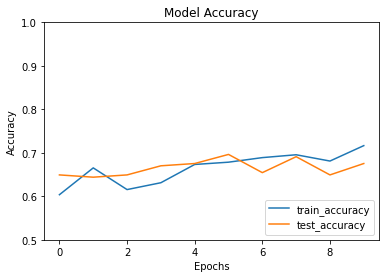

In [285]:
plt.plot(history6.history['accuracy'], label='train_accuracy')
plt.plot(history6.history['val_accuracy'], label = 'test_accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
plt.show()

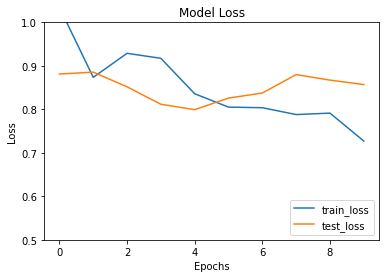

In [287]:
plt.plot(history6.history['loss'], label='train_loss')
plt.plot(history6.history['val_loss'], label='test_loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
plt.show()

In [290]:
from sklearn.metrics import classification_report,confusion_matrix

In [291]:
pred6=best_model.predict(x_test)
pred_digits=np.argmax(pred6,axis=1)

6/6 [==============================] - 20s 3s/step


In [292]:
y_test_inv = label_binarizer.inverse_transform(y_test)

In [293]:
confusionMatrix = confusion_matrix(y_test_inv,pred_digits)
confusionMatrix

array([[29,  0,  2,  2,  2],
       [ 0, 19,  1,  7, 15],
       [ 3,  1, 17,  3, 10],
       [ 1,  1,  2, 29,  5],
       [ 0,  2,  5,  0, 35]], dtype=int64)

<AxesSubplot:>

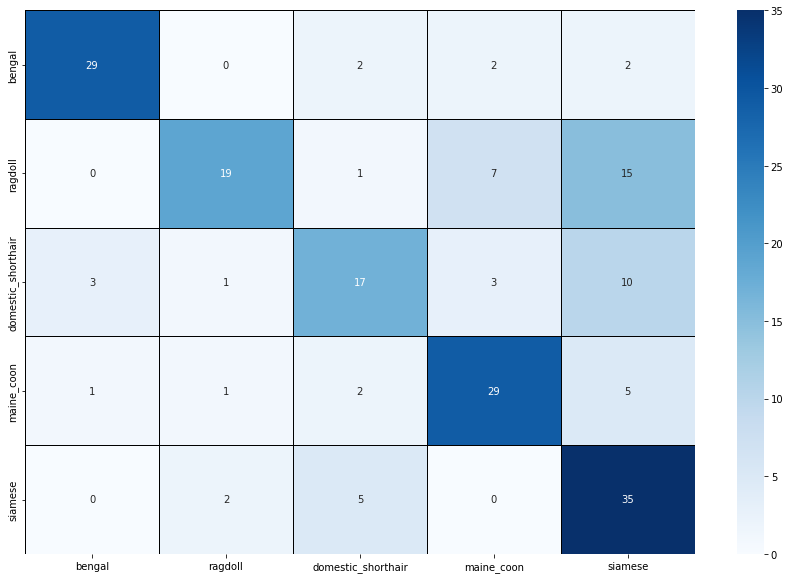

In [296]:
import seaborn as sns
cm = pd.DataFrame(confusionMatrix , index = labels , columns = labels)
plt.figure(figsize = (15,10))
sns.heatmap(cm,cmap= "Blues", linecolor = 'black' , linewidth = 1 , annot = True, fmt='' , xticklabels = labels , yticklabels = labels)

In [298]:
classificationReport = classification_report(y_test_inv, pred_digits, target_names = labels)
print(classificationReport)

                    precision    recall  f1-score   support

            bengal       0.88      0.83      0.85        35
           ragdoll       0.83      0.45      0.58        42
domestic_shorthair       0.63      0.50      0.56        34
        maine_coon       0.71      0.76      0.73        38
           siamese       0.52      0.83      0.64        42

          accuracy                           0.68       191
         macro avg       0.71      0.68      0.67       191
      weighted avg       0.71      0.68      0.67       191



In [339]:
correct_labels = ['bengal', 'domestic_shorthair', 'maine_coon', 'ragdoll', 'siamese']
new_labels = ['bengal', 'ragdoll', 'domestic_shorthair', 'maine_coon', 'siamese']

# Map the predicted labels to the correct label sequence
mapped_pred_labels = [new_labels[label] for label in pred_digits]

# Map the true labels to the correct label sequence
mapped_true_labels = [new_labels[label] for label in y_test_inv]

# Create the confusion matrix with the correct labels
confusionMatrix = confusion_matrix(mapped_true_labels, mapped_pred_labels)

# Create the classification report with the correct labels
classificationReport = classification_report(mapped_true_labels, mapped_pred_labels, target_names=new_labels)

cm = pd.DataFrame(confusionMatrix, index=new_labels, columns=new_labels)


In [341]:
confusionMatrix

array([[29,  2,  2,  0,  2],
       [ 3, 17,  3,  1, 10],
       [ 1,  2, 29,  1,  5],
       [ 0,  1,  7, 19, 15],
       [ 0,  5,  0,  2, 35]], dtype=int64)

<AxesSubplot:>

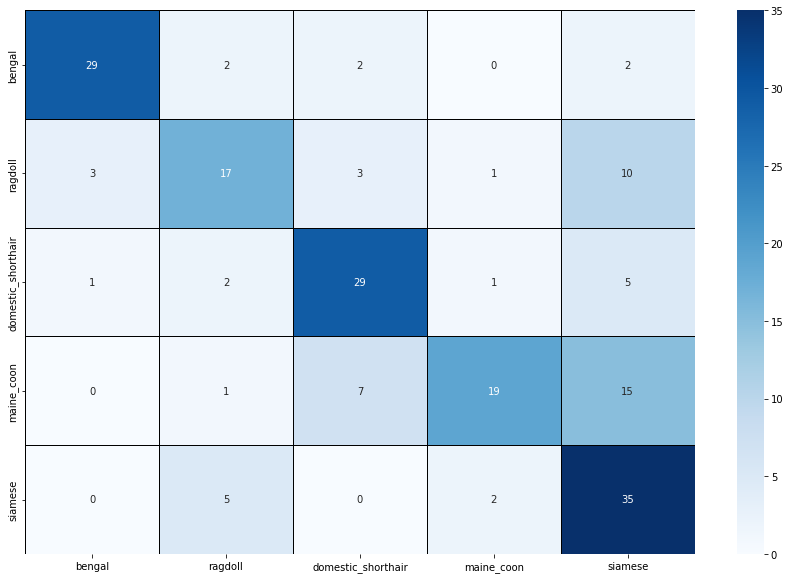

In [342]:
cm = pd.DataFrame(confusionMatrix , index = labels , columns = labels)
plt.figure(figsize = (15,10))
sns.heatmap(cm,cmap= "Blues", linecolor = 'black' , linewidth = 1 , annot = True, fmt='' , xticklabels = labels , yticklabels = labels)

In [340]:
print(classificationReport)

                    precision    recall  f1-score   support

            bengal       0.88      0.83      0.85        35
           ragdoll       0.63      0.50      0.56        34
domestic_shorthair       0.71      0.76      0.73        38
        maine_coon       0.83      0.45      0.58        42
           siamese       0.52      0.83      0.64        42

          accuracy                           0.68       191
         macro avg       0.71      0.68      0.67       191
      weighted avg       0.71      0.68      0.67       191



In [300]:
pred6_train=best_model.predict(x_train)
pred_digits_train=np.argmax(pred6_train,axis=1)

24/24 [==============================] - 83s 3s/step


In [301]:
y_train_inv = label_binarizer.inverse_transform(y_train)

In [303]:
classificationReport_TRAIN = classification_report(y_train_inv, pred_digits_train, target_names = labels)
print(classificationReport_TRAIN)

                    precision    recall  f1-score   support

            bengal       0.85      0.94      0.89       142
           ragdoll       0.82      0.87      0.84       165
domestic_shorthair       0.78      0.80      0.79       136
        maine_coon       0.85      0.92      0.89       153
           siamese       0.91      0.69      0.79       166

          accuracy                           0.84       762
         macro avg       0.84      0.85      0.84       762
      weighted avg       0.85      0.84      0.84       762



In [346]:
from sklearn.metrics import classification_report

pred6_train = best_model.predict(x_train)
pred_digits_train = np.argmax(pred6_train, axis=1)
mapped_pred_labels_train = [new_labels[label] for label in pred_digits_train]
mapped_true_labels_train = [new_labels[label] for label in y_train_inv]

classificationReport_TRAIN = classification_report(mapped_true_labels_train, mapped_pred_labels_train, target_names=new_labels)
print(classificationReport_TRAIN)

24/24 [==============================] - 102s 4s/step
                    precision    recall  f1-score   support

            bengal       0.85      0.94      0.89       142
           ragdoll       0.78      0.80      0.79       136
domestic_shorthair       0.85      0.92      0.89       153
        maine_coon       0.82      0.87      0.84       165
           siamese       0.91      0.69      0.79       166

          accuracy                           0.84       762
         macro avg       0.84      0.85      0.84       762
      weighted avg       0.85      0.84      0.84       762



In [299]:
history7 = best_model.fit_generator(datagen.flow(x_train,y_train, batch_size=32),
                              epochs = 3, validation_data = (x_test,y_test), verbose = 1)

C:\Users\Jadeyuan\AppData\Local\Temp\ipykernel_3536\15965984.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history7 = best_model.fit_generator(datagen.flow(x_train,y_train, batch_size=32),


Epoch 1/3
24/24 [==============================] - 167s 7s/step - loss: 0.7394 - accuracy: 0.7283 - val_loss: 0.8426 - val_accuracy: 0.6806
Epoch 2/3
24/24 [==============================] - 121s 5s/step - loss: 0.7482 - accuracy: 0.6955 - val_loss: 0.8833 - val_accuracy: 0.6440
Epoch 3/3
24/24 [==============================] - 116s 5s/step - loss: 0.7475 - accuracy: 0.7034 - val_loss: 0.8158 - val_accuracy: 0.6963
